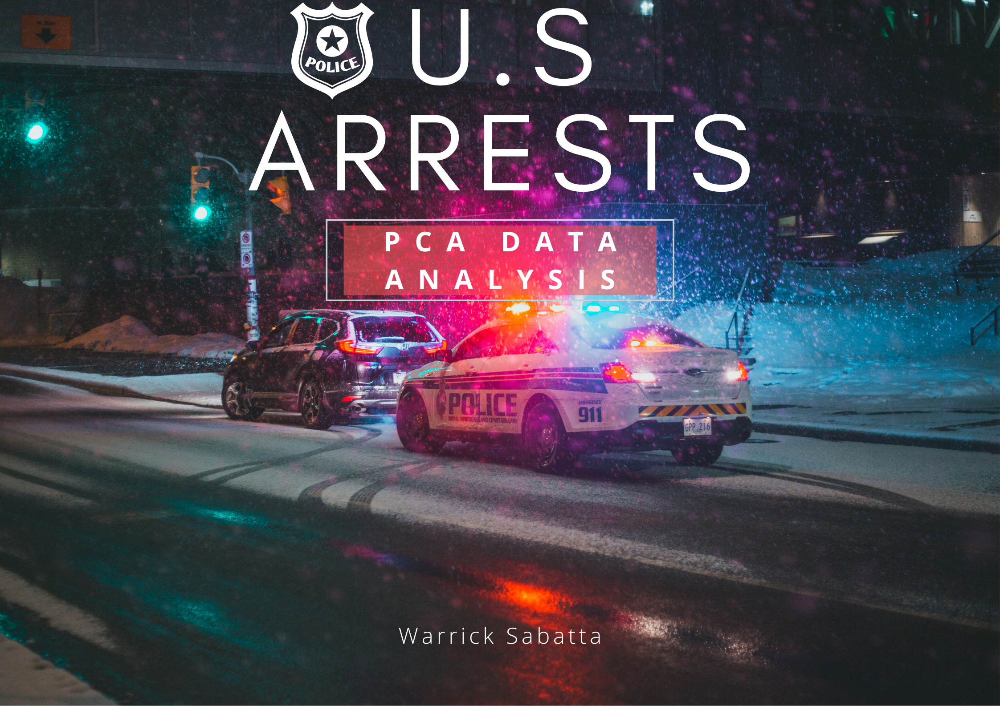

 # <font size="8"  color=#151B54><span style='font-family:Goudy'>PCA analysis on arrests made in the US</font>


<div class="alert alert-warning" markdown="1">

`Source Info:` 

> Name: USArrests.csv  
Owner: Open Source, Unknown  
Shared: With Everyone  
Original Dataset can be found <a href="https://www.kaggle.com/code/kerneler/starter-usarrets-73d905cc-b">HERE</a>  


</div>

## <font size="5" color=maroon><span style='font-family:Bell MT'> Task Objective:</span></font>
> Exploring data taken from a survey of all the arrests that were done in US states. The arrestes are focused on the features: Rape, Murder and Assualts. In this exploration I will performing 3 things:  
- Analyzing what states have higher features than others, and to which feature is the most common.  

- Will be performing PCA analysis on the dataset to figure out what the princile components that best differentiate the observations by determining the directions along which the data points are most spread out. Since this will be using unsupervised learning, I will not be looking at a specific target, but rather allowing the models to observe the outcomes for me.  

- Lastly will be looking at clustering these features to make further observations.



## <font color="#550A35"><center>_____ _________________ _____________________________</center></font>
## </span><font size="5" color="maroon" ><span style='font-family:Bell MT'> Dataset Context:</span></font>

This dataset is a collection of statistical data containing arrests made in 1973 within  US States. The fields contain arrests based off murder, assualt and rape. This data is per 100,000 arrests.🌿  

> Murder - Murder arrests per 100 000  
> Assualt - Assualt arrests per 100 000  
> Rape - Rape arrests per 100 000  
> UrbanPop - Percentage of people living in Urban area within that state




<font color = maroon, font size = 4>Table of Contents</font>
1. [Importing Modules](#intro)<br>
2. [Generating Raw Dataframe](#raw)<br>
3. [Data Preperation & Cleaning](#clean)<br>
4. [Data Visualisations](#vis)<br>
> a. [General overview](#over)<br>
> b. [Distrubution](#dist)<br>
> c. [Principle Component Analysis](#pca)<br>
> d. [Hierarchical Clustering](#hier)<br>
> e. [Kmeans Clustering](#kmeans)<br>

## <font color="#550A35"><center>_____ _________________ _____________________________</center></font>

## <span class="anchor" id="intro"></span><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 1: Importing Modules:</span></font>


<div class="alert alert-success" markdown="1">

<font size="3"><center>Comments for Below Code:</font>
   `Importing Modules:`
   
<blockquote>Importing required packages needed for program</blockquote>




</div>

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import dendrogram, linkage

import plotly.express as px

from itertools import zip_longest

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline


## <span class="anchor" id="raw"></span><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 2: Generating Dataframe:</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Generate a Dataframe:`

* Generating a dataframe called 'arrests_df' from the file 'UsArrests.csv'

   



</div>

In [2]:
arrests_raw_df = pd.read_csv("UsArrests.csv")

## <span class="anchor" id="raw"></span><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 3: Reading Dataframe:</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Reading the Dataframe:`

* Reading the first 5 rows

</div>

In [3]:
#====== Reading data:
arrests_raw_df.head()

,City,Murder,Assault,UrbanPop,Rape
0,Alabama,13.2,236,58,21.2
1,Alaska,10.0,263,48,44.5
2,Arizona,8.1,294,80,31.0
3,Arkansas,8.8,190,50,19.5
4,California,9.0,276,91,40.6


## <span class="anchor" id="clean"></span><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 4: Data cleaning and preparation</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Preparing the data`

* Checking for missing values using 'isnull' function

   `Determining the Independant and dependant variables:`

* Checking to see the what would be the X and Y dependant variables 

   `Checking the Distrubution of data `

* Checking the data layout and distrubution of the features using box plot

</div>

In [4]:
#====== Checking for missing data:
arrests_raw_df.isnull().sum()

City        0
Murder      0
Assault     0
UrbanPop    0
Rape        0
dtype: int64

In [5]:
#====== Checking Shape:
arrests_raw_df.shape

(50, 5)

In [6]:
#====== Checking the overview info:
arrests_raw_df.describe()

,Murder,Assault,UrbanPop,Rape
count,50.00000,50.000000,50.000000,50.000000
mean,7.78800,170.760000,65.540000,21.232000
std,4.35551,83.337661,14.474763,9.366385
min,0.80000,45.000000,32.000000,7.300000
25%,4.07500,109.000000,54.500000,15.075000
50%,7.25000,159.000000,66.000000,20.100000
75%,11.25000,249.000000,77.750000,26.175000
max,17.40000,337.000000,91.000000,46.000000


In [7]:
#====== Checking data types of each column value:
arrests_raw_df.dtypes

City         object
Murder      float64
Assault       int64
UrbanPop      int64
Rape        float64
dtype: object

In [8]:
#====== Setting final dataframe after preperation and changing city to state as the index:
arrests_df = pd.read_csv("UsArrests.csv", index_col = 'City')
arrests_df.index.names = ["State"]

In [9]:
#====== Reading final DF:
arrests_df.head()

,Murder,Assault,UrbanPop,Rape
State,,,,
Alabama,13.2,236,58,21.2
Alaska,10.0,263,48,44.5
Arizona,8.1,294,80,31.0
Arkansas,8.8,190,50,19.5
California,9.0,276,91,40.6


<div class="alert alert-info" role="alert">
    
`Data Cleaning:`  
    
>From the above the dataset is cleaned up and prepared quite well already so know missing values to perform imputation on.



</div>

# <span class="anchor" id="over"> <font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 5: Visualisations `OVERVIEW`</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting Barcharts:`

* I will be exploring the dataset by getting a idea of the general overview and observations of the features
* Setting a stacked barplot that determines the overall count of features per state.
* Dropping 'Urbanpop' feature as this is distinct from the other features (ie irrelevant)
* Setting another barplot that only highlights the maximum count of feature per state, using idxmax() function.


</div>

Text(0, 0.5, 'Quantity')

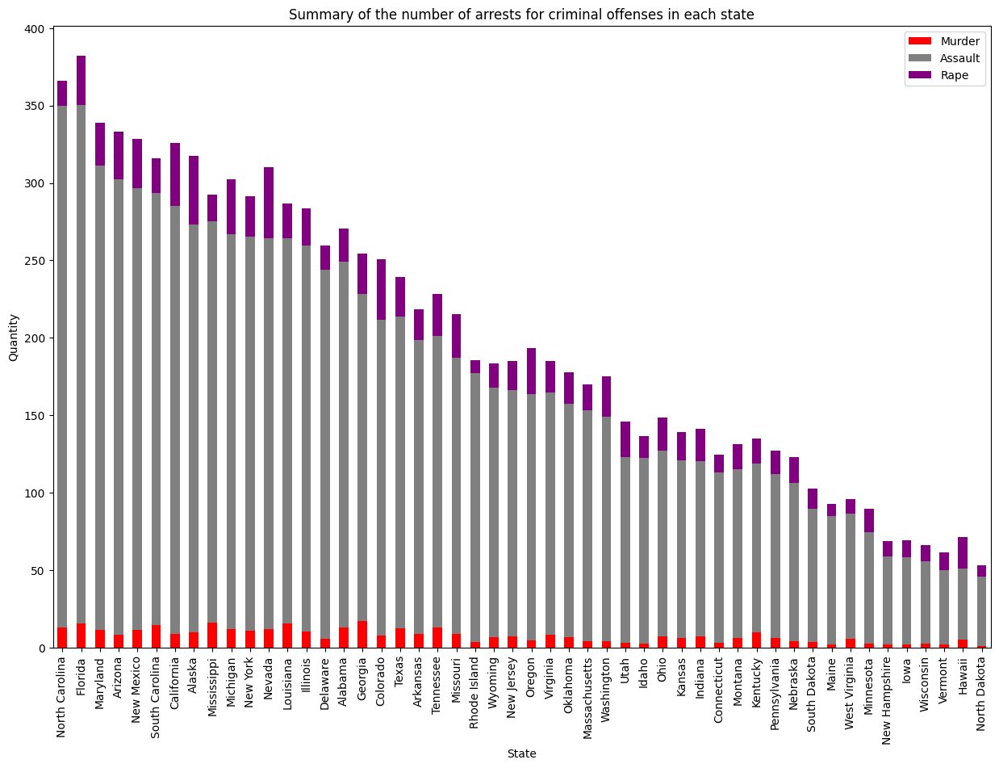

In [10]:
#====== Plotting stacked barchart for overview:
#==== Setting parameter settings:
plt.rcParams['figure.figsize'] = [15,10]
colours = ("red","grey","purple")

overview = arrests_df.drop(columns = 'UrbanPop')
overview = overview.sort_values('Assault',ascending = False).plot(kind = 'bar', stacked = True,color = colours)

plt.title("Summary of the number of arrests for criminal offenses in each state")
plt.ylabel("Quantity")


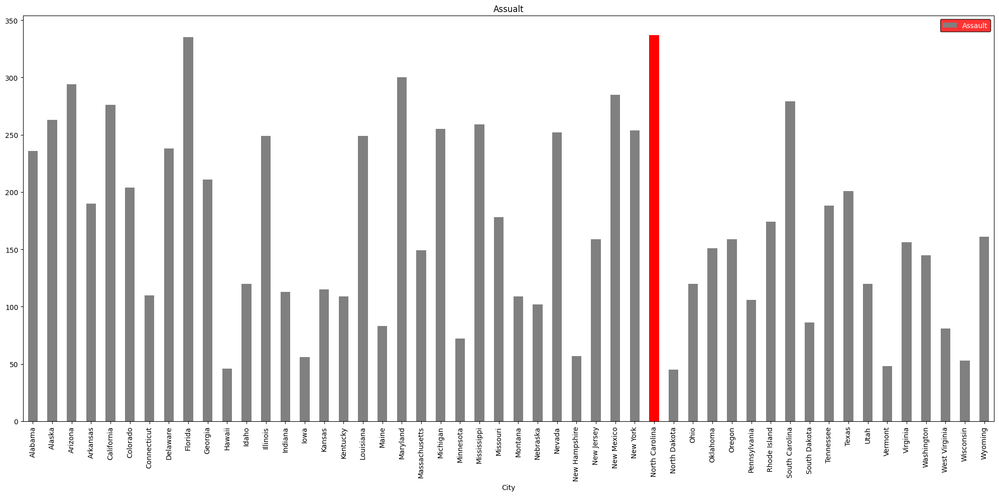

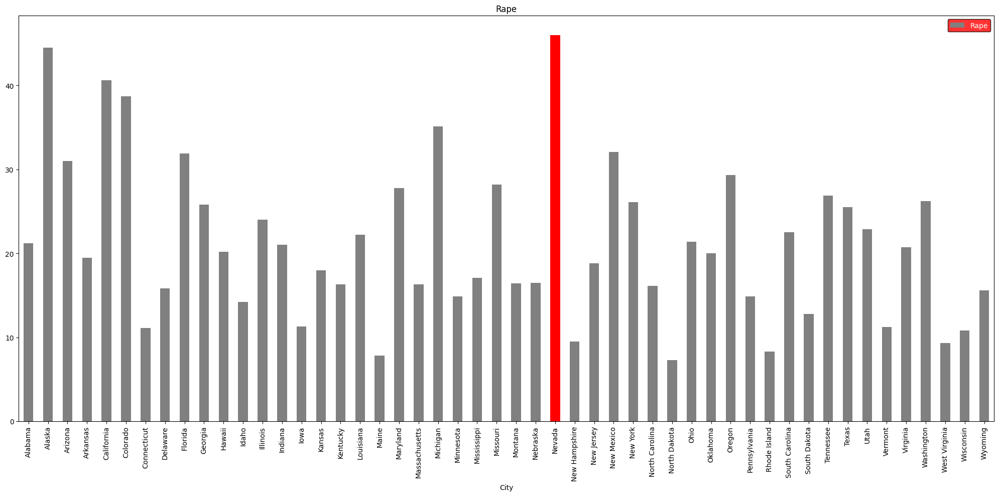

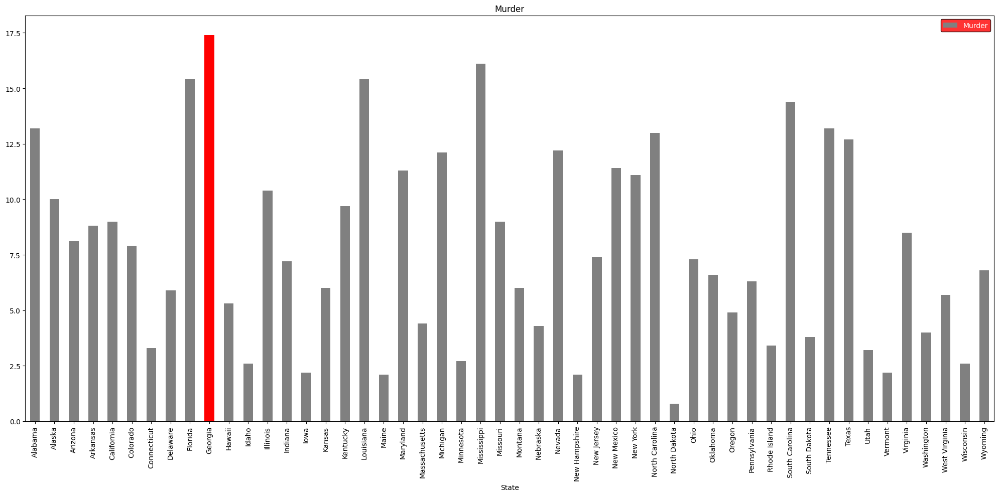

In [11]:
df = pd.read_csv("UsArrests.csv")

plt.rcParams["figure.figsize"] = (20, 10)
plt.rcParams["figure.autolayout"] = True

ax = df.plot.bar(x= 'City', y = ['Assault'], legend = False, color = 'grey')
max_value_a = df['Assault'].max()
max_index_a = df['Assault'].idxmax()
ax.patches[max_index_a].set_facecolor('red')
plt.title('Assualt')
plt.legend(labelcolor = "white", edgecolor = "black", facecolor = "red")


ax = df.plot.bar(x= 'City', y = ['Rape'], legend = False, color = 'grey')
max_value_a = df['Rape'].max()
max_index_a = df['Rape'].idxmax()
ax.patches[max_index_a].set_facecolor('red')
plt.title('Rape')
plt.legend(labelcolor = "white", edgecolor = "black", facecolor = "red")

ax = arrests_df.plot.bar(use_index= True, y = 'Murder', legend = False, color = 'grey')
max_value = df['Murder'].max()
max_index = df['Murder'].idxmax()
ax.patches[max_index].set_facecolor('red')
plt.title('Murder')
plt.legend(labelcolor = "white", edgecolor = "black", facecolor = "red", title_fontsize = '30')

plt.show()

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting Piecharts:`

* I will be exploring the dataset by getting a idea of the general avg indicator of the features.
* I will also be looking at each selected states avg urban population feature and comparing it with the overall urban population feature to see if there is a correlation.
* Setting new column called state_codes, matching up the state codes with the state names
* Setting 2 pie charts, setting the parameters, features, labels and colours. Keeping the colour codes the same per state and feature to view more effectively


</div>

In [12]:
#====== Setting new column and adding in a list of state codes
arrests_df['State_codes'] = ['AL','AK','AZ','AR','CA','CO','CT','DE','FL',
'GA','HI','ID','IL','IN','IA','KS','KY','LA',
'ME','MD','MA','MI','MN','MS','MO','MT','NE',
'NV','NH','NJ','NM','NY','NC','ND','OH','OK',
'OR','PA','RI','SC','SD','TN','TX','UT','VT',
'VA','WA','WV','WI','WY']


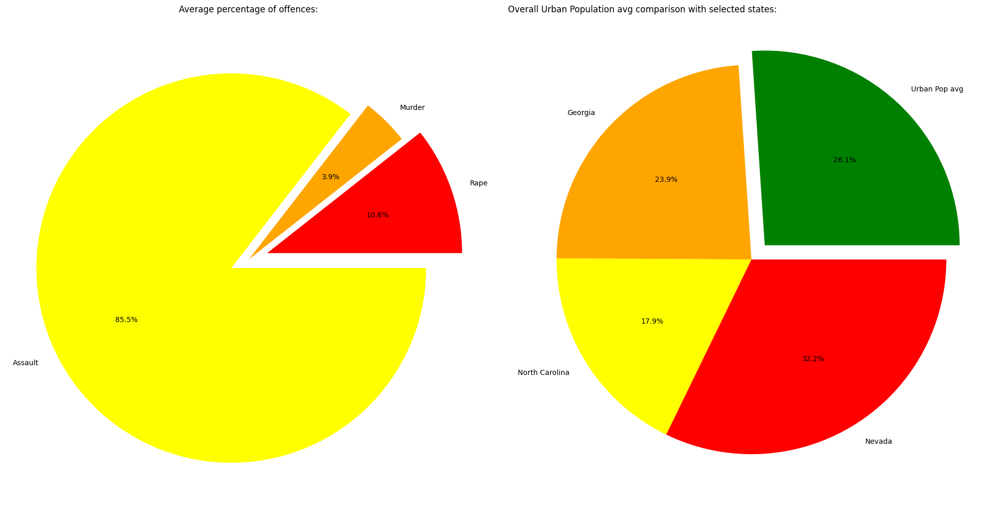

In [13]:
#====== Extracting data per feature:
rape_avg = arrests_df['Rape'].mean().round(2)
murder_avg = arrests_df['Murder'].mean().round(2)
assualt_avg = arrests_df['Assault'].mean().round(2)

#====== Extracting data per statecode's avg urban pop:
urban_avg = arrests_df['UrbanPop'].mean()
georgia = arrests_df.loc[arrests_df['State_codes'] == 'GA', 'UrbanPop']
ncarolina = arrests_df.loc[arrests_df['State_codes'] == 'NC', 'UrbanPop']
nevada = arrests_df.loc[arrests_df['State_codes'] == 'NV', 'UrbanPop']

#====== Setting features for 1st pie chart:
fig, axes = plt.subplots(1, 2)

plt.rcParams["figure.figsize"] = (8, 8)
colours = ['Red','Orange','Yellow']
sizes = [rape_avg, murder_avg, assualt_avg]
labels = ['Rape', 'Murder', 'Assault']
explode = (0.1,0,0.1)

axes[0].pie(sizes,explode = explode, labels=labels, autopct='%1.1f%%', colors = colours)

axes[0].set_title('Average percentage of offences:')

#====== Setting features for 2nd pie chart:
plt.rcParams["figure.figsize"] = (8, 8)
colours_2 = ['Green','Orange','Yellow','Red',]
sizes_2 = [urban_avg,georgia, ncarolina, nevada]
labels_2 = ['Urban Pop avg','Georgia', 'North Carolina', 'Nevada']
explode = (0.1,0,0,0)

axes[1].pie(sizes_2,explode = explode, labels=labels_2, autopct='%1.1f%%', colors = colours_2)

axes[1].set_title('Overall Urban Population avg comparison with selected states:',loc = 'left')

plt.tight_layout()

<div class="alert alert-info">
    
`Observations:`  
    
From the above I can clearly see that the dominant feature is the Assualts per state. These numbers are way higher than the other features, this will be considered when performing PCA and Clustering. Some chareteristics I have observed:  

- The numbers of 'Rape' and 'Muder' are closely proportional to one another, this could indicate that they are usually connected.
    
* Murder at 3.9%  
* Rape at 10.6%
* Assault at 85.5%  
    
* North Carolina has the highests assualt
* Nevada has the highest rape
* Georgia has the highest murder  
    
* The overall urban population is more closely associated with Georgia (which we determined has the highest murder) so its possible that urban population has an affect with muder offences
    



</div>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting choropleth map:`

* `PLEASE USE  'pip install plotly'`-(#source = https://plotly.com/python/choropleth-maps/)  

* Setting a choropleth map from plotly.express.
* The map will show the features as per state on the map.
* Setting 3 maps that show the features of Rape, Murder and Assault per state.

</div>

In [14]:
#====== Setting 1st map with feature 'Rape':
fig = px.choropleth(arrests_df,
                    locations='State_codes', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='Rape',
                    color_continuous_scale="Cividis",
                    title = "States with Rape Offences:"
                    )
fig.show()

#====== Setting 2nd map with feature 'Murder':
fig = px.choropleth(arrests_df,
                    locations='State_codes', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='Murder',
                    color_continuous_scale="Cividis", 
                    title = "States with Murder Offences:"
                    )
fig.show()

#====== Setting 1st map with feature 'Assault':
fig = px.choropleth(arrests_df,
                    locations='State_codes', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='Assault',
                    color_continuous_scale="Cividis", 
                    title = "States with Assault Offences:"
                    )

fig.show()

<div class="alert alert-info">
    
`Observations:`  
    
From the above some characteristics I have observed:  

    
* The states with high features seem to be on the outskirts of America and not so much inland.
* The 'heat map' shows the states with high Rape arrests are in close proximity to one another
* The murder and assualt arrests are also in close proximity with one another near the east coast.
* These states(especially Alaska) also have a higher percentage of unemployemt and poverty in comparison to the states more central. This is a major factor.  
    > for more research: https://www.self.inc/info/poverty-rates-in-each-state/



</div>

# <span class="anchor" id="dist"><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 6: Visualisations `DISTRUBUTION`</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting pairplot:`

* Firstly checking the distrubution of data before getting to machine learning.
* Generating a pair plot to see the distrubution of data within the features. This helps identifying potential patterns, correlations, and trends between the features.


</div>

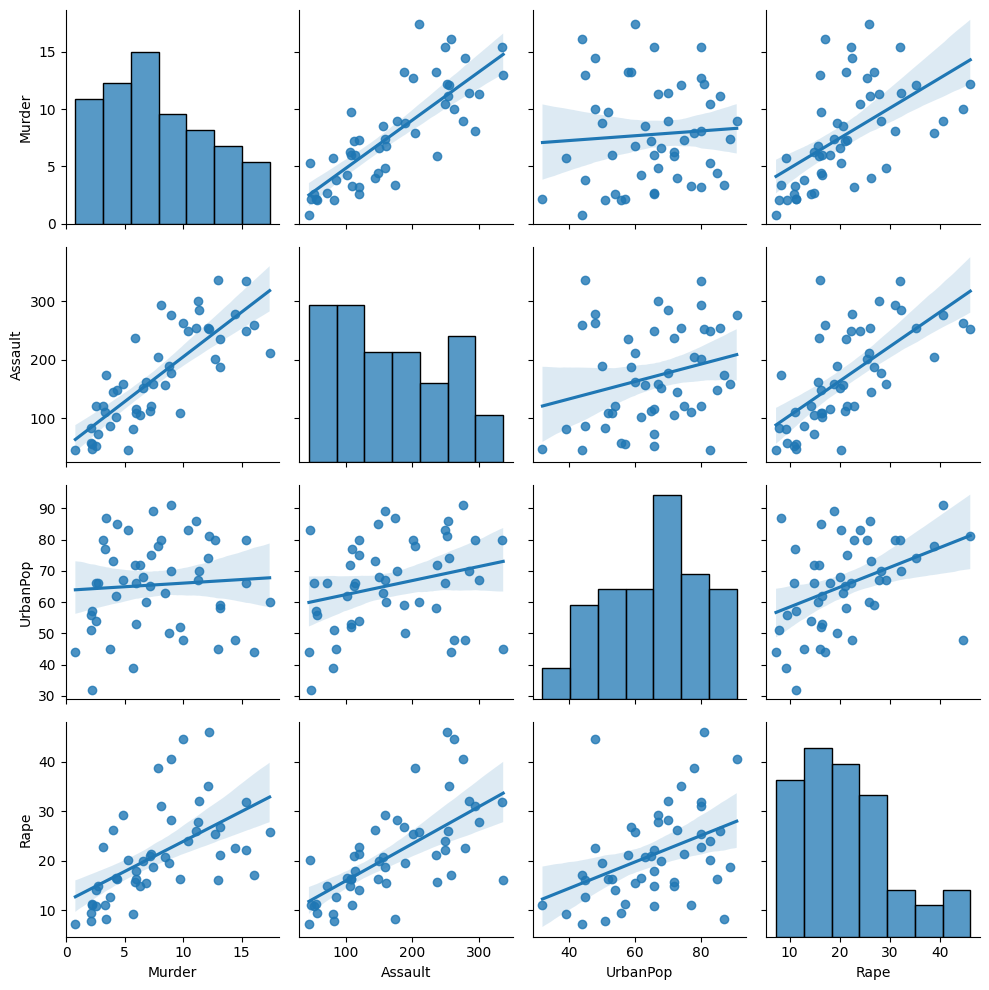

In [15]:
sns.pairplot(arrests_df, kind ='reg')


<div class="alert alert-info">
    
`Observations:`  
    
>From the above plot I can see that the data is fairly scattered which with the help of clustering I will be able to determine more in depth.We can see that there are a few features that seem to indicate outliers so we will need to perfomr PCA in order to reduce these


</div>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting Correlation heatmap:`

* Generating a correlation heatmap to show the correlation of the features to one another.
* Setting the correlation variable to extract the features from the arrests_df dataset
* The np.zeros_like() function will create an array of zeros with the same shape and data type as the corrs array.
* The expression 'set_mask[np.triu_indices_from(set_mask)]' selects the elements in the set_mask array that correspond to the upper triangle indices and returns them as a 1-dimensional array within the heatmap I am creating


</div>

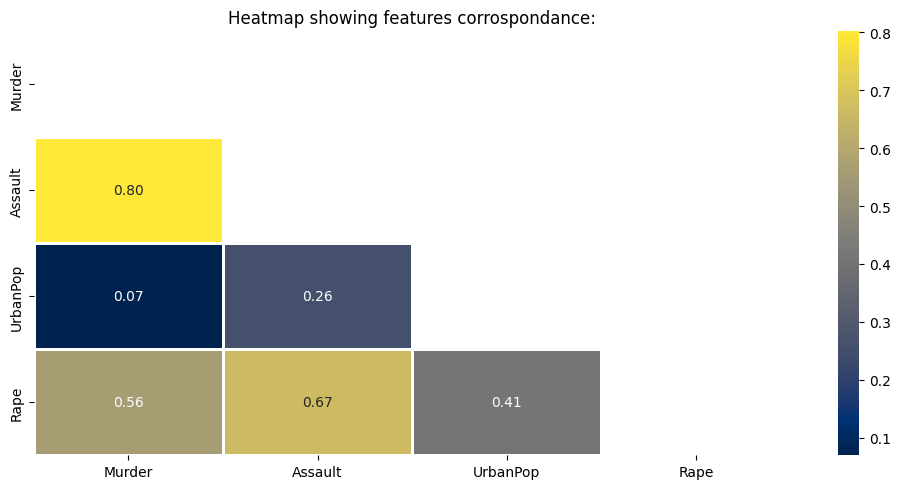

In [16]:
#====== Extracing correlation features
corrs = arrests_df.corr()

#====== Setting figure parameters:
fig, ax = plt.subplots(figsize=(10, 5))

#=====: Setting masking values:
set_mask = np.zeros_like(corrs)
set_mask[np.triu_indices_from(set_mask)] = True

#====== Setting heatmap:
ax = sns.heatmap(corrs, cmap="cividis", annot=True, fmt=".2f", mask=set_mask, linewidth=2)
plt.title("Heatmap showing features corrospondance:")
    
plt.show()


<div class="alert alert-info">
    
`Observations`  
    
>From the above I can deduce that the Urban Population feature has very low metrics in comparison with the other features. This would mean the the percentage of urban population has little to do with the offences been comitted. It is not a primary factor when consdiering the features. Also there is no negative values which indicates that our correlations are a good fit to use for PCA.



</div>

# <span class="anchor" id="pca"><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 7: Visualisations `PCA`</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `PCA:`

(Principal Component Analysis (PCA) is a dimensionality reduction technique used to transform a high-dimensional dataset into a lower-dimensional representation while preserving the most important information in the data.)
* Setting the featured data into the PCA model in order to reduce and transform into more sensible information
* Using function 'np.set_printoptions' to set the Numpy array display, a precision of two decimal places.
* Printing the PCA model data

</div>

In [17]:
#====== Setting np array option:
np.set_printoptions(precision=2)

#====== Dropping column 'state_codes' and extracting the other features values:
X = arrests_df.drop(["State_codes"],axis=1).values.squeeze()

#====== Fitting data into pca model:
pca = PCA()

#====== Scaling the data:
X_std = StandardScaler().fit_transform(X)

X_trans = pca.fit_transform(X_std)

df_pca = pd.DataFrame(X_trans)

#====== Displaying PCA dataset:
df_pca.head()

,0,1,2,3
0,0.985566,1.133392,-0.444269,0.156267
1,1.950138,1.073213,2.040003,-0.438583
2,1.763164,-0.745957,0.054781,-0.834653
3,-0.141420,1.119797,0.114574,-0.182811
4,2.523980,-1.542934,0.598557,-0.341996


<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Plotting parralel coordinates:`

* Setting 2 charts using parallel co-ordinates visualisation.
* Will be comparing the PCA model with the standard dataset to see how much has been affected by the model

</div>

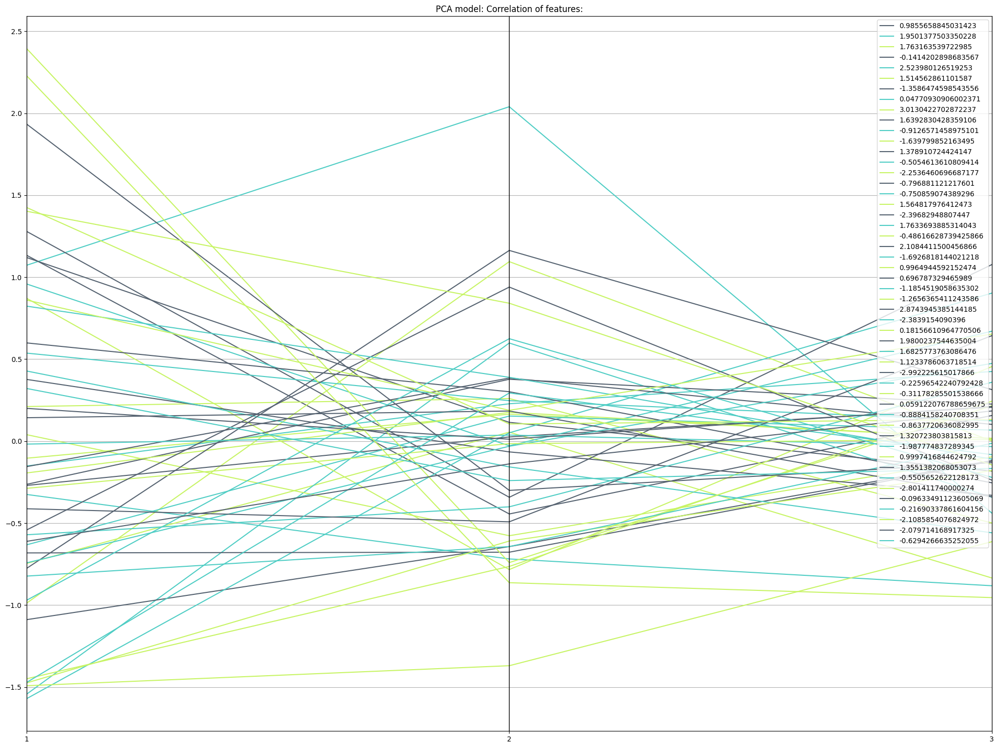

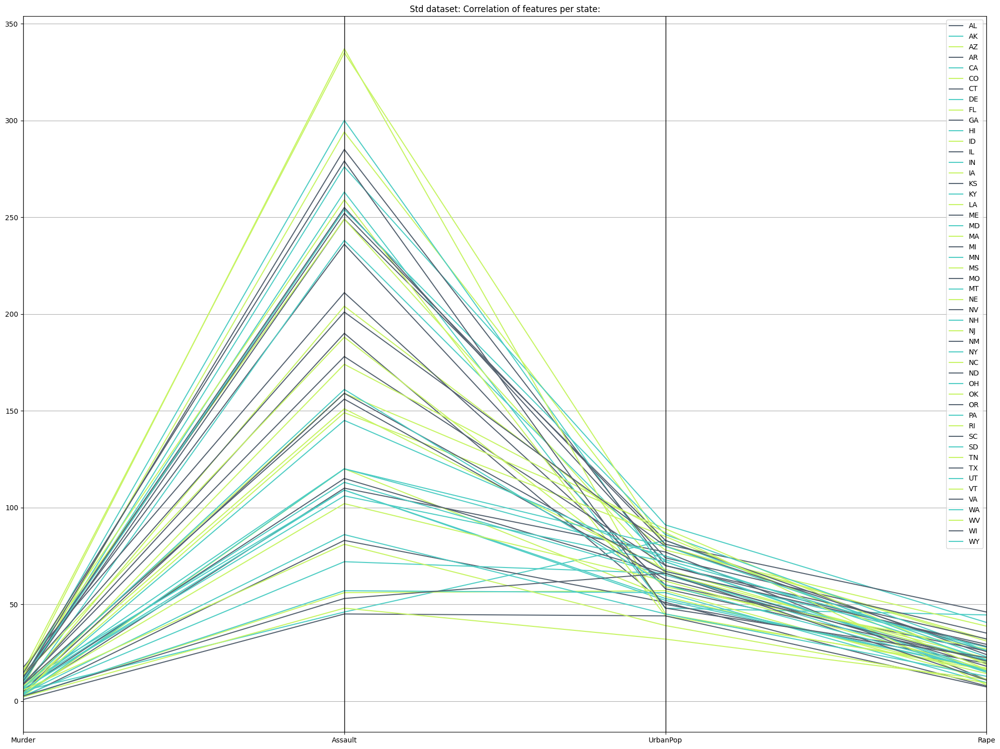

In [18]:
#====== Plotting 1st PC visualisation using the PCA model:
plt.figure(figsize=(20,15))

pd.plotting.parallel_coordinates(df_pca,0, color=('#556270', '#4ECDC4', '#C7F464'))
plt.title("PCA model: Correlation of features:")
plt.show()

#====== Plotting 2nd PC visualisation using the standard dataset:
plt.figure(figsize=(20,15))

pd.plotting.parallel_coordinates(arrests_df,'State_codes', color=('#556270', '#4ECDC4', '#C7F464'))
plt.title("Std dataset: Correlation of features per state:")
plt.show()

<div class="alert alert-info">
    
`Observations:`  
    
>From the above I can clearly see a more clear pattern based off just fitting in the std dataset. And it shows us a overall visualistaion of the number of arrests per offence per each state. Once again we can see that the Assualt feature is way higher than the Rape and murder feature.  
    
The PCA model seems to have scattered the data more allowing for closer inspection when going to attempt clustering. The pattern is also more erractic making it difficult to interpret and see any sensible patterns.This mightbe due to the feature 'UrbanPop' being included as we have already distinguished that feature is irrelevant. There also seems to be some outliers that deviate from the more closely packed lines. Will need to have a look at a Bi plot aswell to get another view on this.



</div>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting BIPLOT:`

* Generating a biplot in order to determine the importance of each feature. The arrows length will assist me with identifying patterns and trends. The plot will in turn show me how each Stae contributes to different directions of the features (Rape, Murder, Assualt)
* Setting a function called 'biplot': (Adapted from: https://ostwalprasad.github.io/machine-learning/PCA-using-python.html)
> xs- this takes the x axis score from the pca model  
> ys- this takes the y axis score from the pca model  
> Using scalex/scaley to deterine the range within the scores for the x and y axis  
> Setting scatterplot  
> Setting the annotate that enables a text to a specific location on a plot (in my case will use the State names)  
> The coefficent will be taken from the principle components from the PCA model, setting it to a 2 dimensional array.    

* Setting labels from corrs dataframe (as already extracted from previous correlation map.)
* Setting the states to be the data point references so we can identify the annotates.
* Setting the parameters for the definded function:biplot 


</div>

In [19]:
#====== Setting Defined Function:
def biplot(score,coeff,labels=None,points=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())

    fig, ax = plt.subplots()    

    ax.scatter(xs * scalex,ys * scaley,s=5)

    for i in range(0,len(xs)):
        txt = states[i]
        ax.annotate(txt, (xs[i]* scalex, ys[i]* scaley))

    for i in range(n):
        ax.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            ax.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
        else:
            ax.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
 
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title("Biplot revealing the patterns of offences commited per state")
    plt.grid()

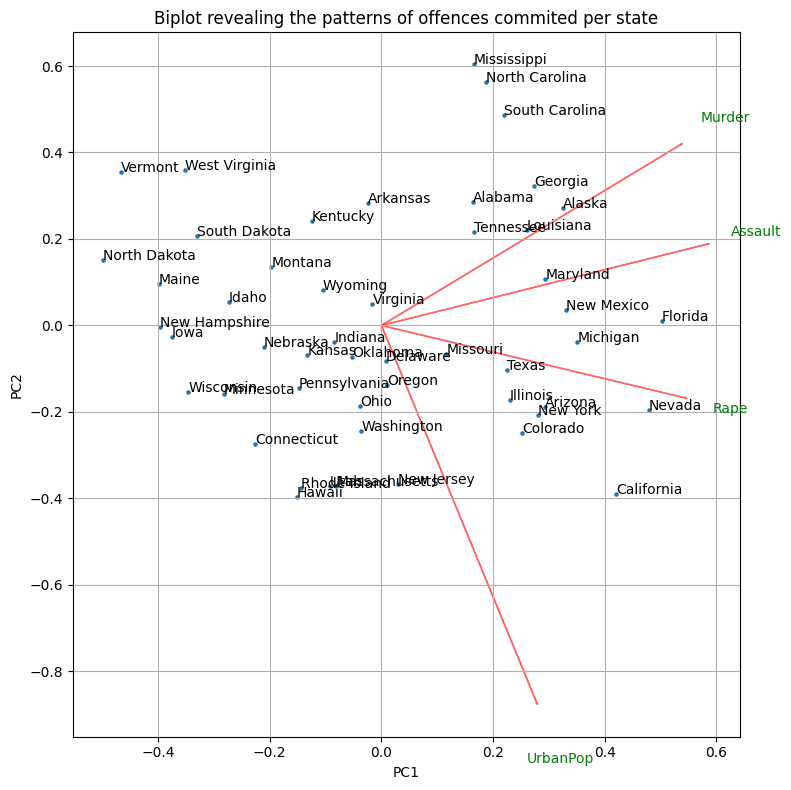

In [20]:
#====== Setting the label names:
labels = corrs.columns
states = arrests_df.index

#====== Generating the biplot:
biplot(X_trans[:,0:2],np.transpose(pca.components_[0:2, :]),list(labels),list(states))
plt.show()



<div class="alert alert-info">
    
`Biplot Analysis`  
    
>From the above I can observe that the UrbanPop feature varies alot from the other features, as the arrow's length is longer. I can also see that the other features are similiar in length with the states not overlapping too much. This in turns shows me that these features are more important.



</div>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting Important features:`

* Setting varaibles to visualise the score of the features within the dataset. The importance of these features will be revealed.
* Firstly changing the precision in order to see more decimals by using the 'display_float_format' (ie the 'set_option()' function allows me to customize the display format. I will be setting the decimal places to 3, by using the lamba function
* Setting each importance feature to index 0, in order to get first value onwards. The 'abs' is a python built in function that wil return the absolute value of a given number.
* Setting feature importances to a DF.
* Setting a simply bar chart showing the features 1 and 2 comparisons


</div>

In [21]:
#====== Customising the display format:
pd.set_option('display.float_format', lambda x: '%.3f' % x) #change precision to see more decimal places

#====== Setting importance features 1 and 2, setting index at 0
pc1 = abs( pca.components_[0] )
pc2 = abs( pca.components_[1] )

#====== Setting features 1,2 into a DF:
feat_df = pd.DataFrame()

feat_df["Features"] = list(labels)
feat_df["PC1 Importance"] = pc1
feat_df["PC2 Importance"] = pc2

feat_df

,Features,PC1 Importance,PC2 Importance
0,Murder,0.536,0.418
1,Assault,0.583,0.188
2,UrbanPop,0.278,0.873
3,Rape,0.543,0.167


Text(0.5, 1.0, 'PC1 vs PC2 Importance')

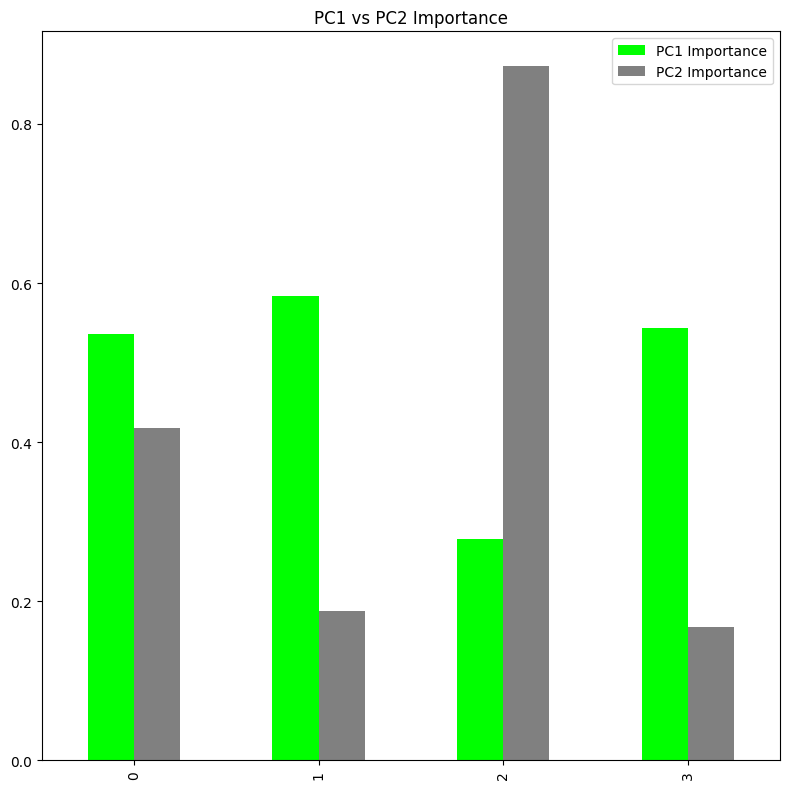

In [22]:
#====== Generating a bar chart:
feat_df.plot(kind = "bar", color = ["lime","grey"])
plt.title("PC1 vs PC2 Importance")

<div class="alert alert-info">
    
`Features Observations`  
    
>From the above I can clearly see that PC1 has higher rate of importance. Also noted is that the features contributed fairly even.Again I can speculate that the UrbanPop is once again low in importance from the PC1. In other words the PC1 importance shows more stability and can be used as a good interpreter



</div>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting Scree and Cumalative plots:`

* Setting scree plot in order to show the features variances of the principle components in a decreasing order. I can determine the elbow that shows the nr of principle components to retain.
* Setting a cummulative plot to show the data distrubution of the cummulative frequecies  (proportions of the dataset).

</div>

Text(0.5, 1.0, 'Cumulative Explained Variance')

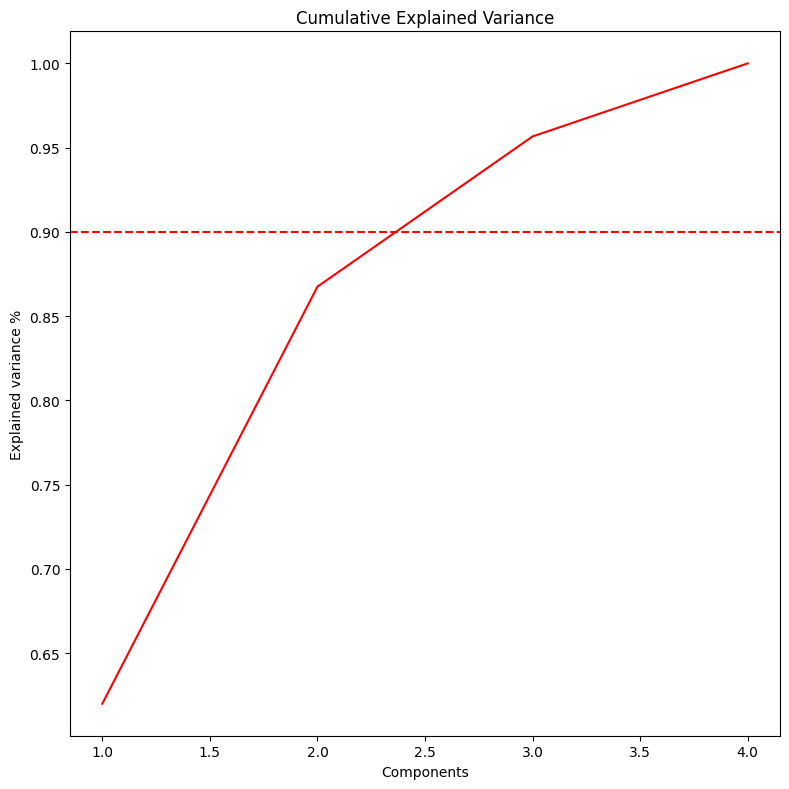

In [23]:
#====== Generating scree plot:
plt.plot(range(1,len(pca.explained_variance_ratio_ )+1),
         np.cumsum(pca.explained_variance_ratio_),
         c='red')

plt.axhline(y=0.9,color='r',linestyle="--")

plt.ylabel('Explained variance %')
plt.xlabel('Components')
plt.title("Cumulative Explained Variance")

Text(0.5, 1.0, 'Scree plot')

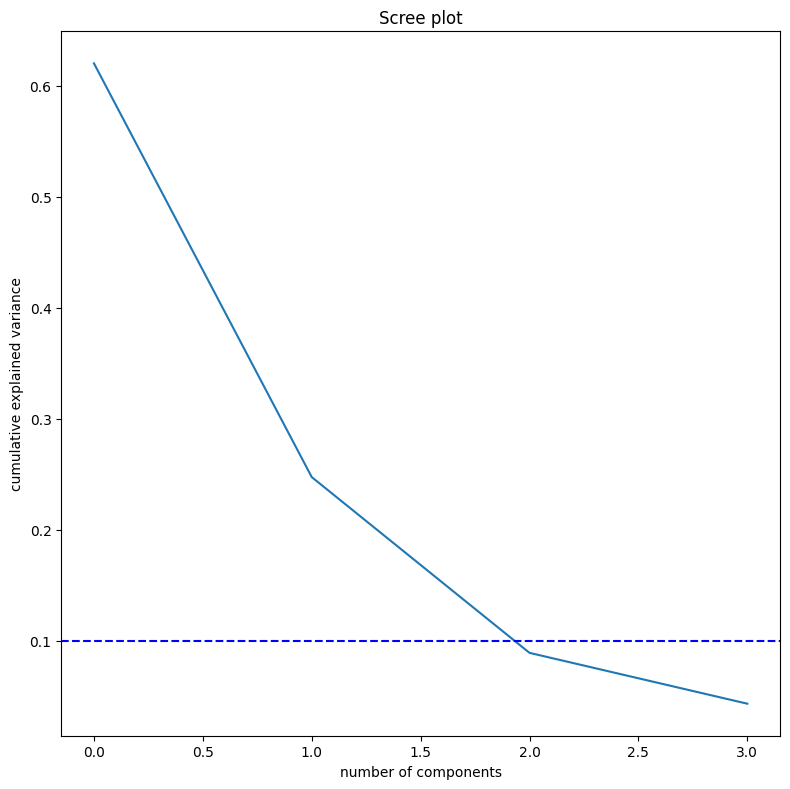

In [24]:
#====== Geberating Cummulative plot:
plt.plot(pca.explained_variance_ratio_)
plt.axhline(y=0.1,color='blue',linestyle="--")

plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("Scree plot")


<div class="alert alert-info">
    
`Observations:`  
    
>From the above I would say the first 3 components show the deviation and variance. These component can be used for clustering now as they show most of the variability. In otherwords, the chart shows me that the first 3 component shave a strong deviation and only seem to standard normalising from 3/4 onwards. 



</div>

# <span class="anchor" id="hier"><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 8: Visualisations `Hierarchical Clustering`</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Setting Hierarchical Clustering`

* Firstly, creating new dataframe extracting the first 3 components/features
* Setting the model to use for the H clustering.(Agglomerative Clustering)
* Fitting in new DF.
* Generating 5 plots using 5 different methods of linkage.
</div>

In [25]:
#====== Setting new DF:
new_df_pca = pd.DataFrame(X_trans[:,0:3], index = arrests_df.index)
new_df_pca.head()

,0,1,2
State,,,
Alabama,0.986,1.133,-0.444
Alaska,1.950,1.073,2.040
Arizona,1.763,-0.746,0.055
Arkansas,-0.141,1.120,0.115
California,2.524,-1.543,0.599


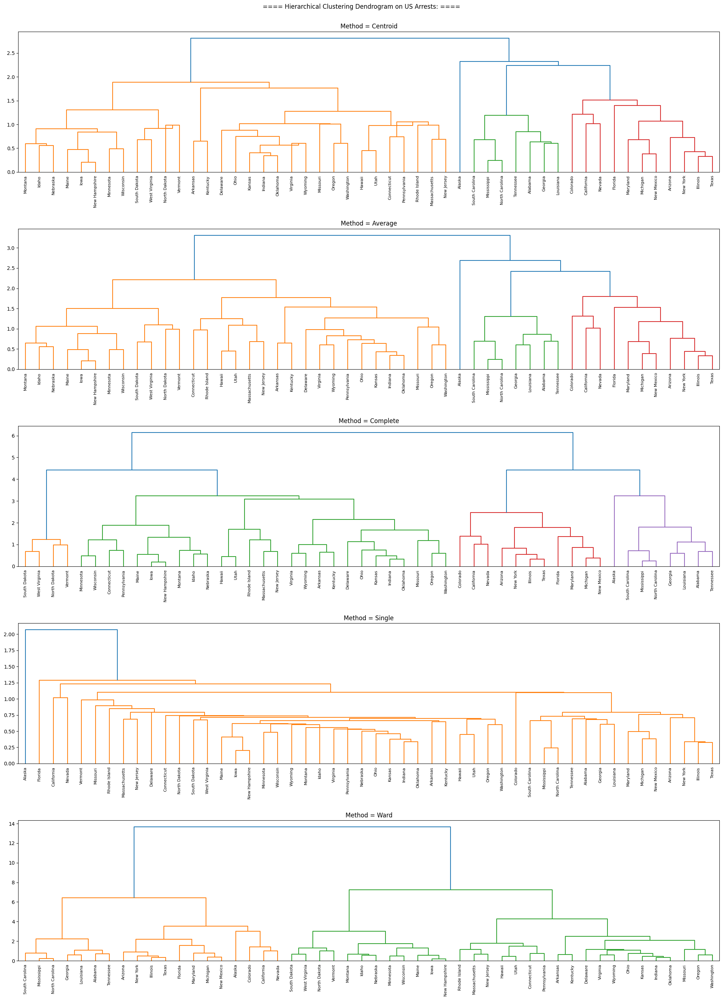

In [26]:
#====== Setting new model and fitting in new DF:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(new_df_pca)

#====== Setting parameters for clustering dendogram:
plt.rcParams['figure.figsize'] = [20, 28]
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1)
fig.suptitle('==== Hierarchical Clustering Dendrogram on US Arrests: ====\n\n')

#====== Setting 1st dendogram, centriod method:
ax1.set_title("\nMethod = Centroid")
dendrogram(linkage(new_df_pca, method='centroid'), labels=new_df_pca.index, ax=ax1) 

#====== Setting 2nd dendogram, average method:
ax2.set_title("\nMethod = Average")
dendrogram(linkage(new_df_pca, method='average'), labels=new_df_pca.index, ax=ax2)

#====== Setting 3rd dendogram, Complete method:
ax3.set_title("\nMethod = Complete")
dendrogram(linkage(new_df_pca, method='complete'), labels=new_df_pca.index, ax=ax3)

#====== Setting 4th dendogram, Single method:
ax4.set_title("\nMethod = Single")
dendrogram(linkage(new_df_pca, method='single'), labels=new_df_pca.index, ax=ax4)

#====== Setting 5th dendogram, ward method:
ax5.set_title("\nMethod = Ward")
dendrogram(linkage(new_df_pca, method='ward'), labels=new_df_pca.index, ax=ax5)

#====== Showing all 5 dendograms:
plt.show()


<div class="alert alert-info">
    
`Observations`  
    
>From the above I am going to selct the ward method as it has simplified the clustering to 3 which will be good to use.

</div>

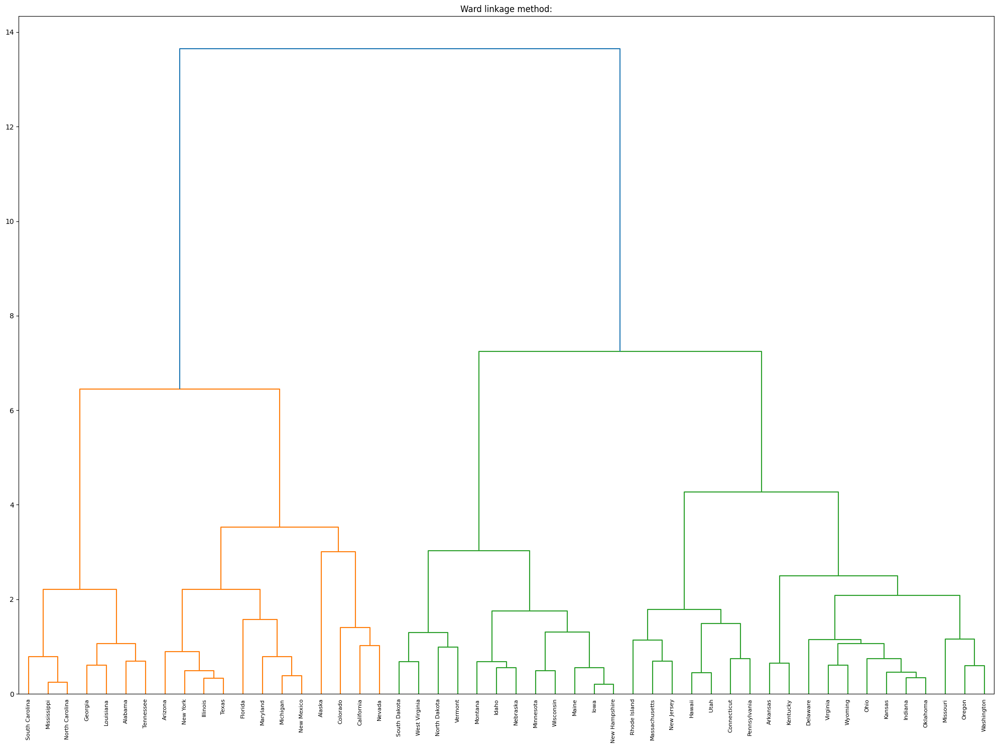

In [27]:
#====== Showing dendogram, method Ward:
plt.rcParams['figure.figsize'] = [20, 15]

dendrogram(linkage(new_df_pca, method='ward'), labels=new_df_pca.index)
plt.title("Ward linkage method:")

plt.show()

# <span class="anchor" id="kmeans"><font size="5" color=#151B54 ><span style='font-family:Bell MT'> Step 9: Visualisations `Kmeans Clustering`</span></font>

<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Kmeans Clustering`

* Performing Kmeans clustering to group the similiar data points together. This will place the various states and their features together in groups based off their similiarities.
* Setting the x and y axis for the first 3 components
* Setting k nr to 3 (as identified in Hierarchical clustering above with the ward linkeage method).
* Plottong a scatter plot based of the input of kmeans clustering.
</div>

Text(0, 0.5, 'Dim 1')

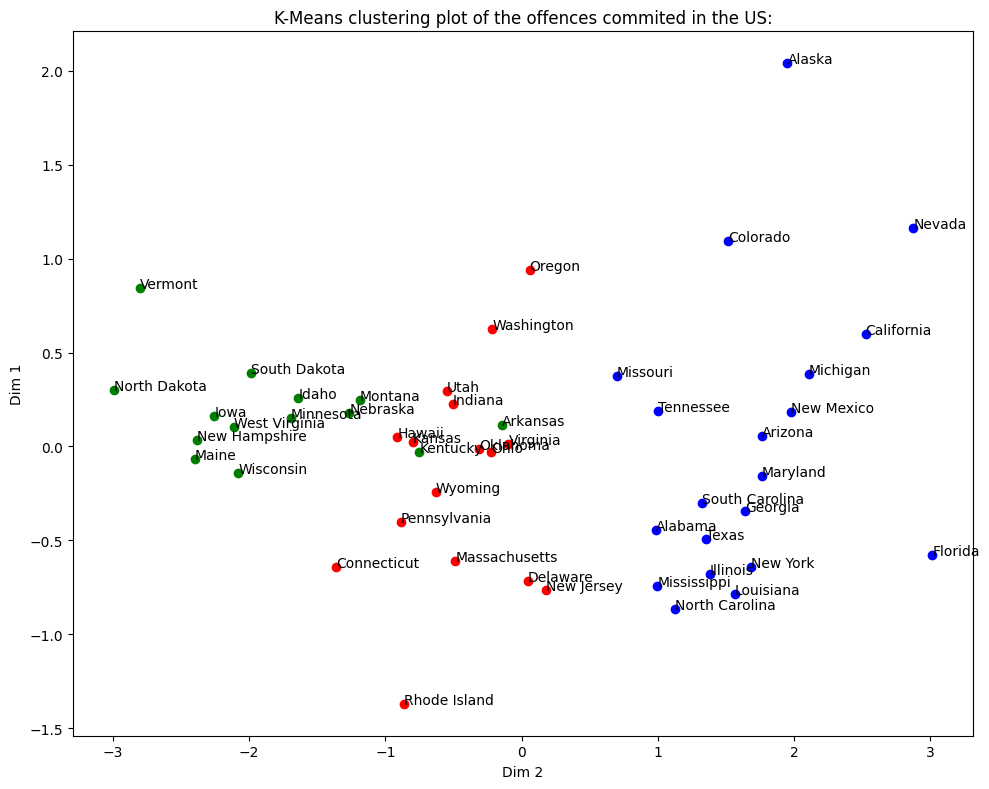

In [28]:
#====== Extarcting the first 3 components:
x = X_trans[:,0]
y = X_trans[:,2]

#====== Generating a Kmeans clustering model:
k=3
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(df_pca)
cent = kmeans.cluster_centers_

#====== Plotting a scatter plot based of the 3 clusters:
fig, ax = plt.subplots(figsize = (10,8))
colours = 'rbgy'

for i in range(0,k):
    ax.scatter(x[cluster_labels == i],y[cluster_labels == i],c = colours[i]) 

for i in range(0,len(x)):
        txt = states[i]
        ax.annotate(txt, (x[i], y[i]))
        
ax.set_title("K-Means clustering plot of the offences commited in the US:")
ax.set_xlabel("Dim 2")
ax.set_ylabel("Dim 1")


<div class="alert alert-success" markdown="1">

<font size="3"><center> Dataframe Comments for Below Code:</font>
   `Exploring the Cluster groups`

* Setting variables listing the names of the states per cluster group recognised in the Kmeans scatter plot.
* Setting the labels names to use for the for loop
* Using a for loop to extarct the names of the states from the data in cluster_labels. The for loop will be based off the condition if the value is = to 0,1 or 2 (ie- The group clusters)
* Appending extrated date of states into the groups
* Then creating a new DF with the 3 groups and plotting a bar chart to view
</div>

In [32]:
#====== Extracting the label names:
labels_col = cluster_labels.reshape(-1,)
states_list = arrests_df.index.to_list()
group_data = list(zip(labels_col,states_list))

#====== Setting 3 empty lists to use for the groups:
group1 =[]
group2 =[]
group3 =[]

#====== Setting for loop to extract data from the cluster_labels
#==== Appending to relevant group lists:
for i in range(len(group_data)):
    if group_data[i][0] == 0:
        group1.append(group_data[i][1])
    elif group_data[i][0] == 1:
        group2.append(group_data[i][1])
    elif group_data[i][0] == 2:
        group3.append(group_data[i][1])

In [33]:
#====== Setting the groups into a varibale called 'data' using zip_longest function from 'itertools' module.
data = list(zip_longest(group1, group2, group3))

#====== Setting data into a new dataframe:
groups_df = pd.DataFrame(data, columns=['Cluster Group 1 [Moderately safe]', 'Cluster Group 2[Unsafe]',
                                        'Cluster Group 3[Relatively safe]'])

print(groups_df)

   Cluster Group 1 [Moderately safe] Cluster Group 2[Unsafe]  \
0                        Connecticut                 Alabama   
1                           Delaware                  Alaska   
2                             Hawaii                 Arizona   
3                            Indiana              California   
4                             Kansas                Colorado   
5                      Massachusetts                 Florida   
6                         New Jersey                 Georgia   
7                               Ohio                Illinois   
8                           Oklahoma               Louisiana   
9                             Oregon                Maryland   
10                      Pennsylvania                Michigan   
11                      Rhode Island             Mississippi   
12                              Utah                Missouri   
13                          Virginia                  Nevada   
14                        Washington    

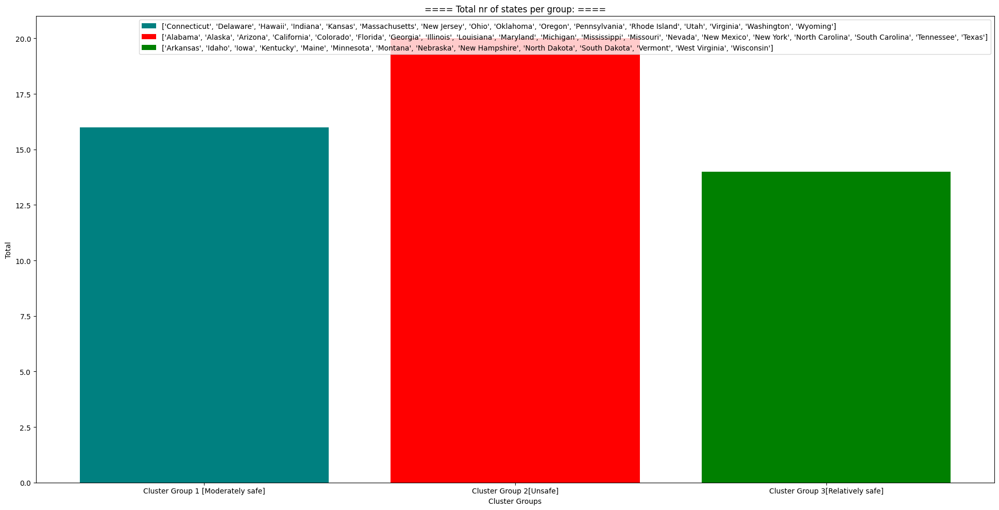

In [34]:
#====== Setting variable to count the non-null values:
group_counts = groups_df.count()

#====== Generating a bar plot extracting the values counted:
#==== Setting the parameters for the bar chart:
colour_b = "Teal","Red","Green"
plt.rcParams['figure.figsize'] = [20, 10]

plt.bar(group_counts.index, group_counts.values,label =[group1,group2,group3],color = colour_b )

plt.xlabel('Cluster Groups')
plt.ylabel('Total')
plt.title('==== Total nr of states per group: ====')
plt.legend(loc= "best")

#====== Displaying the bar chart:
plt.show()


<div class="alert alert-info">
    
`Final Comments:`  
    
>From the above Exercise it has been noted how affective clustering and PCA can be on a dataset. Before I analyzed the data using these methods, I was sure that the percenatge of the the Urban Population would have been a direct contrubutor to the crime offences committed, but I was proven otherwise. It seems that the Urban population had very little to do with the crime offences. Also what is interresting to note is that the offences of Rape were in teh west coast and Alaska being a poor and  more isolated state, which could indicate a variety of reasons (which you could delve into further EDA).  
      
>>The 3 cluster groups I identified could mean places these states into sections of how many arrests were done or which states were safer than others. Cluster Group 2 would mean that these states were not as safe as the others, as the counts and patterns identified were higher than Cluster Group 1 and 3. This is why I indiacted in square brackets how safe they were.



</div>